In [1]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

In [2]:
df = pd.read_excel('PorCorreo.xlsx')

In [3]:
df.head(3)

,Unnamed: 0,EMAIL,SBol_Vend,Prom_Pagado,Sum_Pagado,%_Promo,Prom_Horas_Ant,Venta_Ant,Recencia,PAGO_EFECTIVO,PAGO_TARJETA,DESC_ADULTO,DESC_DISCAPACIDAD,DESC_ESTUDIANTE,DESC_MENOR,DESC_PETFRIENDLY,DESC_PROFESOR,DESC_PROMOCION ESPECIAL,DESC_SENECTUD
0,0,00-MAZA.ESQUISTOSO@ICLOUD.COM,4,953.664978,3814.659912,6.25,2.5,0.75,187,1,0,0,0,0,0,0,0,1,0
1,1,000047787@LAMAR.ORG.MX,1,609.909973,609.909973,0.00,16.0,0.00,50,0,1,0,0,1,0,0,0,0,0
2,2,0019122@UP.EDU.MX,1,1047.410034,1047.410034,5.00,5.0,0.00,345,0,1,0,0,0,0,0,0,1,0


In [4]:
n=2
if n==1:
    df=df[df['Primer_Compra']==0]
    #df.drop(columns=df.columns[6:-1], axis=1, inplace=True)
    df.drop(columns='Primer_Compra', axis=1, inplace=True)
elif n==2:
    df=df[df['SBol_Vend']>1]

df

,Unnamed: 0,EMAIL,SBol_Vend,Prom_Pagado,Sum_Pagado,%_Promo,Prom_Horas_Ant,Venta_Ant,Recencia,PAGO_EFECTIVO,PAGO_TARJETA,DESC_ADULTO,DESC_DISCAPACIDAD,DESC_ESTUDIANTE,DESC_MENOR,DESC_PETFRIENDLY,DESC_PROFESOR,DESC_PROMOCION ESPECIAL,DESC_SENECTUD
0,0,00-MAZA.ESQUISTOSO@ICLOUD.COM,4,953.664978,3814.659912,6.25,2.5,0.750000,187,1,0,0,0,0,0,0,0,1,0
3,3,0022ANDREAGONZALEZ@GMAIL.COM,2,504.309998,1008.619995,0.00,24.5,0.500000,778,0,1,0,0,1,0,0,0,0,0
7,7,01MENDEZ.CESAR@GMAIL.COM,9,1112.066772,10008.600586,5.00,10.0,1.000000,180,0,1,0,0,0,0,0,0,1,0
10,10,0209396@UP.ED.MX,2,1034.479980,2068.959961,5.00,4.0,1.000000,795,0,1,1,0,0,0,0,0,0,0
11,11,0209396@UP.EDU.MX,8,892.562500,7140.500000,10.00,7.5,0.500000,684,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137005,137005,zorobabel@ejemplo.com,2,1183.189941,2366.379883,0.00,3.5,0.000000,380,1,0,1,0,0,0,0,0,0,0
137018,137018,zulma.pilar.herrera.cortes@ejemplo.com,2,1012.930054,2025.860107,0.00,2.0,0.000000,769,1,0,1,0,0,0,0,0,0,0
137023,137023,zuri.alejandra@ejemplo.com,3,1198.280029,3594.840088,0.00,42.0,0.666667,289,1,0,1,0,0,0,0,0,0,0
137031,137031,zuriel.hernández.lópez@ejemplo.com,2,880.599976,1761.199951,10.00,2.0,0.000000,991,1,0,0,0,0,0,0,0,1,0


In [5]:
df=df[df.columns[1:]]
X = df[df.columns[1:]]

X.head()

,SBol_Vend,Prom_Pagado,Sum_Pagado,%_Promo,Prom_Horas_Ant,Venta_Ant,Recencia,PAGO_EFECTIVO,PAGO_TARJETA,DESC_ADULTO,DESC_DISCAPACIDAD,DESC_ESTUDIANTE,DESC_MENOR,DESC_PETFRIENDLY,DESC_PROFESOR,DESC_PROMOCION ESPECIAL,DESC_SENECTUD
0,4,953.664978,3814.659912,6.25,2.5,0.75,187,1,0,0,0,0,0,0,0,1,0
3,2,504.309998,1008.619995,0.00,24.5,0.50,778,0,1,0,0,1,0,0,0,0,0
7,9,1112.066772,10008.600586,5.00,10.0,1.00,180,0,1,0,0,0,0,0,0,1,0
10,2,1034.479980,2068.959961,5.00,4.0,1.00,795,0,1,1,0,0,0,0,0,0,0
11,8,892.562500,7140.500000,10.00,7.5,0.50,684,0,1,0,0,0,0,0,0,1,0


In [6]:
m=2
if m==0:
    # 1. Crea una instancia del escalador estándar
    scaler = StandardScaler()
    
    # 2. Aplica el ajuste y la transformación
    X_escalado = scaler.fit_transform(X)
    figname='2d_pca_clustersDBSCANSS.png'
elif m==1:
    # 1. Crea una instancia del escalador robusto
    robust_scaler = RobustScaler()
    
    # 2. Aplica el ajuste y la transformación
    X_escalado = robust_scaler.fit_transform(X)
    figname='2d_pca_clustersDBSCANRS.png'
elif m==2:
    # 1. Crea una instancia del escalador Min-Max
    minmax_scaler = MinMaxScaler()
    
    # 2. Aplica el ajuste y la transformación
    X_escalado = minmax_scaler.fit_transform(X)
    figname='2d_pca_clustersDBSCANMM.png'
    
# Elegir un valor para min_samples (por ejemplo, 2 veces el número de dimensiones)
min_samples_val = 2*len(X.columns)

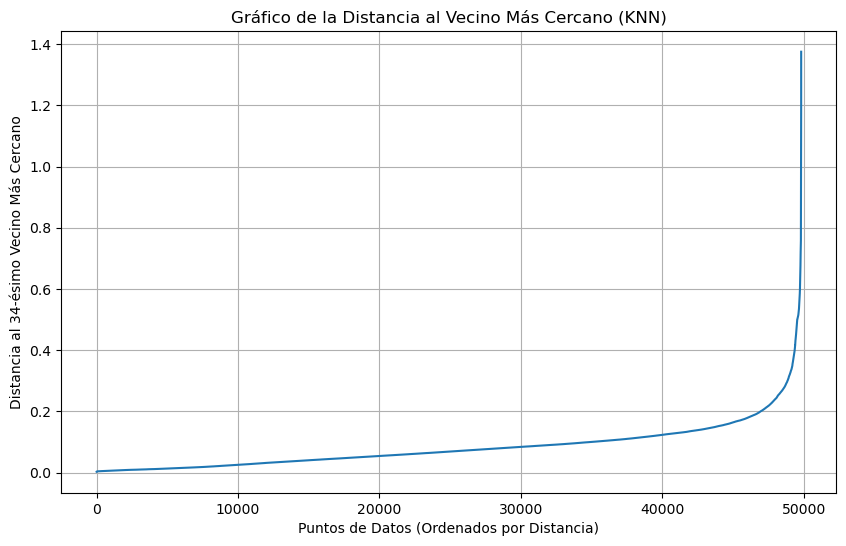

In [7]:
# Calcular las distancias al vecino más cercano
neighbors = NearestNeighbors(n_neighbors=min_samples_val)
neighbors_fit = neighbors.fit(X_escalado)
distances, indices = neighbors_fit.kneighbors(X_escalado)

# Ordenar y graficar las distancias
distances = np.sort(distances[:, min_samples_val-1], axis=0)
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('Gráfico de la Distancia al Vecino Más Cercano (KNN)')
plt.xlabel('Puntos de Datos (Ordenados por Distancia)')
plt.ylabel(f'Distancia al {min_samples_val}-ésimo Vecino Más Cercano')
plt.grid(True)
plt.show()

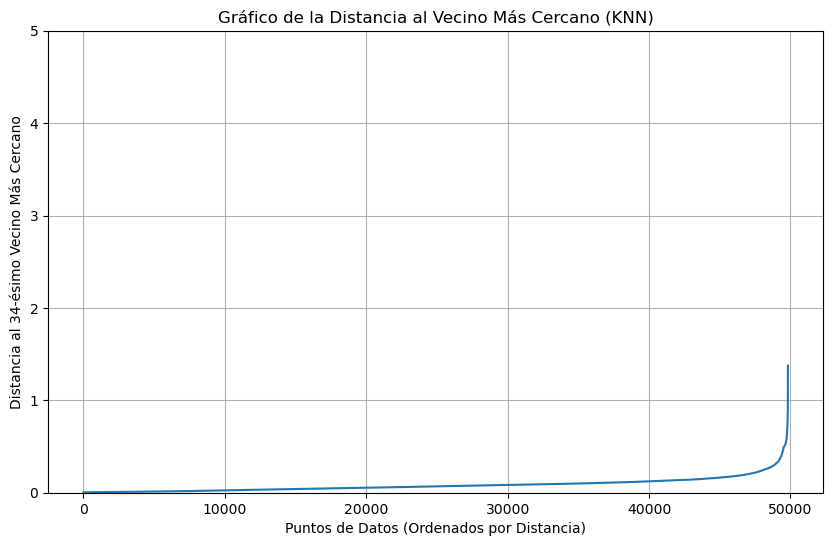

In [8]:
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('Gráfico de la Distancia al Vecino Más Cercano (KNN)')
plt.xlabel('Puntos de Datos (Ordenados por Distancia)')
plt.ylabel(f'Distancia al {min_samples_val}-ésimo Vecino Más Cercano')
plt.grid(True)
plt.ylim(0,5)
plt.show()

In [9]:
# Aplicar DBSCAN con los parámetros que elegiste del gráfico
# REEMPLAZA ESTOS VALORES con los que encontraste en el gráfico
eps_param = 2  # Ejemplo: el valor del 'codo' que encontraste
min_samples_param = 2*len(X.columns) # Ejemplo: 2 * n dimensiones
min_samples_param = 30
min_samples_param

30

In [10]:
dbscan_model = DBSCAN(
    eps=eps_param,
    min_samples=min_samples_param,
    #algorithm="ball_tree",  
    algorithm="kd_tree",  
    leaf_size=40         # default es 30, puedes probar 20–50
)
df['Cluster'] = dbscan_model.fit_predict(X_escalado)

# DBSCAN puede encontrar un clúster llamado -1, que son los outliers
n_clusters = len(set(df['Cluster'])) - (1 if -1 in df['Cluster'] else 0)
n_outliers = list(df['Cluster']).count(-1)

print(f"\nDBSCAN encontró {n_clusters} clústeres y {n_outliers} outliers (ruido).")

# Analizar el perfil de cada clúster (excluyendo outliers)
if n_clusters > 0:
    cluster_profile = df.groupby('Cluster')[df.columns[1:]].mean().round(2)
    print("\n--- Perfil promedio de cada Cluster (usando DBSCAN) ---")
    print(cluster_profile)


DBSCAN encontró 1 clústeres y 0 outliers (ruido).

--- Perfil promedio de cada Cluster (usando DBSCAN) ---
         SBol_Vend  Prom_Pagado  Sum_Pagado  %_Promo  Prom_Horas_Ant  \
Cluster                                                                
0             5.14       898.42     4661.97      3.5           100.4   

         Venta_Ant  Recencia  PAGO_EFECTIVO  PAGO_TARJETA  DESC_ADULTO  \
Cluster                                                                  
0             0.63    442.25           0.32          0.68         0.36   

         DESC_DISCAPACIDAD  DESC_ESTUDIANTE  DESC_MENOR  DESC_PETFRIENDLY  \
Cluster                                                                     
0                     0.01             0.03        0.05               0.0   

         DESC_PROFESOR  DESC_PROMOCION ESPECIAL  DESC_SENECTUD  Cluster  
Cluster                                                                  
0                 0.01                     0.48           0.06      0.0 

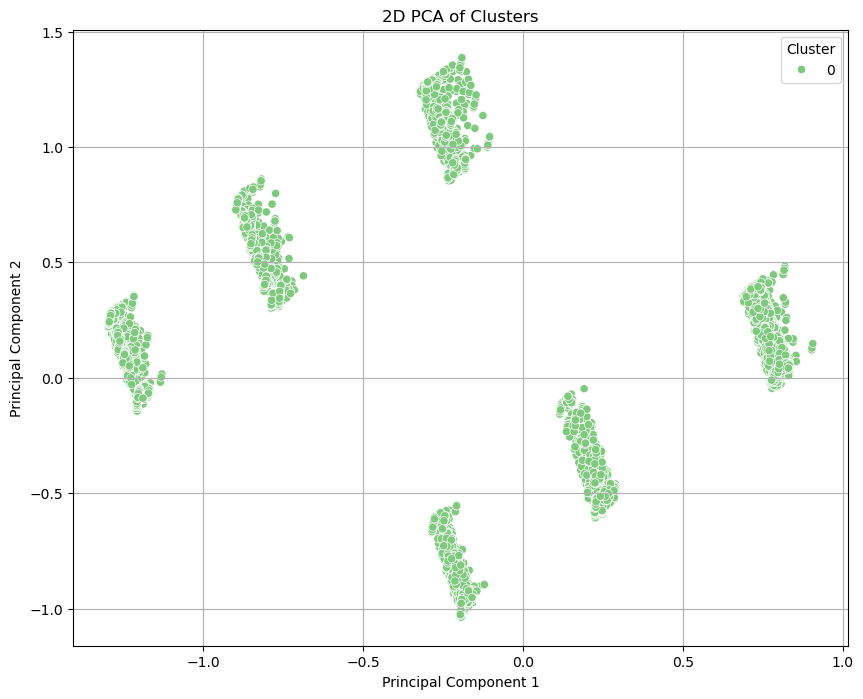

In [11]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Perform PCA to reduce to 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_escalado) # Assuming X_escalado is your scaled data

# Create a new DataFrame with the PCA results and cluster labels
pca_df = pd.DataFrame(data = X_pca, columns = ['principal component 1', 'principal component 2'])
pca_df['Cluster'] = df['Cluster'].values

# Visualize the clusters in 2D
plt.figure(figsize=(10, 8))
sns.scatterplot(x='principal component 1', y='principal component 2', hue='Cluster', data=pca_df, palette="Accent", legend='full')
plt.title('2D PCA of Clusters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
# Save the plot as a PNG file
plt.savefig(figname)

plt.show()

In [12]:
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np

# Asumimos que X_escalado ya existe y tiene nombres de columnas (si no, usa X.columns)
# Ejemplo: si X_escalado es un array de numpy, necesitamos los nombres de las características originales.
# Si X es un DataFrame de Pandas:
# nombres_originales = X.columns
# Si X es un array de numpy con 5 columnas:
# nombres_originales = [f'feature_{i+1}' for i in range(X_escalado.shape[1])]

# IMPORTANTE: Asegúrate de reemplazar 'X.columns' si tus datos originales no son un DataFrame
try:
    nombres_originales = X.columns  # Intenta obtener nombres de un DataFrame
except AttributeError:
    # Si X es un array de numpy, usa la forma de abajo para obtener el número de columnas
    nombres_originales = [f'Variable_{i+1}' for i in range(X_escalado.shape[1])]


# 1. Ejecutar PCA con TODAS las componentes posibles
pca = PCA(n_components=None)
pca.fit(X_escalado)

# --- 1. RESUMEN DE VARIANZA (Igual que antes) ---

# Extraer la información clave
varianza_individual = pca.explained_variance_ratio_
varianza_acumulada = np.cumsum(varianza_individual)
nombres_componentes = [f'CP{i+1}' for i in range(len(varianza_individual))]

# Crear el DataFrame de resumen de varianza
df_pca_resumen = pd.DataFrame({
    'Componente Principal': nombres_componentes,
    'Varianza Explicada (%)': varianza_individual * 100,
    'Varianza Acumulada (%)': varianza_acumulada * 100
})

print("## 1. Resumen de la Varianza Explicada por Componente")
# Usamos to_string() para asegurar la impresión en consola
print(df_pca_resumen.head(10).style.format({
    'Varianza Explicada (%)': "{:.2f}%",
    'Varianza Acumulada (%)': "{:.2f}%"
}).to_string())

# ----------------------------------------------------
# --- 2. CARGAS (LOADINGS) DE LAS COMPONENTES ---

# La matriz de cargas (loadings) se encuentra en pca.components_
# Esto nos dice cómo se relaciona cada variable original con cada CP.
cargas_pca = pca.components_

# 4. Crear el DataFrame de cargas
# Las filas son las Componentes Principales (CP1, CP2, etc.)
# Las columnas son las Variables Originales
df_cargas = pd.DataFrame(
    cargas_pca.T,
    columns=nombres_componentes,
    index=nombres_originales
)

# 5. Mostrar la tabla de cargas (usamos las 3-5 primeras componentes para interpretación)
print("\n" + "="*50)
print("## 2. Contribución de Variables a las Componentes Principales (Loadings)")
print("Los valores cercanos a 1 o -1 indican una fuerte contribución.")

# Mostraremos solo las primeras 5 componentes para facilitar la lectura
df_cargas

## 1. Resumen de la Varianza Explicada por Componente
 Componente Principal Varianza Explicada (%) Varianza Acumulada (%)
0 CP1 43.14% 43.14%
1 CP2 20.80% 63.94%
2 CP3 13.06% 77.00%
3 CP4 7.50% 84.50%
4 CP5 5.96% 90.46%
5 CP6 3.91% 94.37%
6 CP7 2.39% 96.76%
7 CP8 0.95% 97.71%
8 CP9 0.66% 98.36%
9 CP10 0.64% 99.01%


## 2. Contribución de Variables a las Componentes Principales (Loadings)
Los valores cercanos a 1 o -1 indican una fuerte contribución.


,CP1,CP2,CP3,CP4,CP5,CP6,CP7,CP8,CP9,CP10,CP11,CP12,CP13,CP14,CP15,CP16,CP17
SBol_Vend,0.000189,0.000002,-0.000087,0.001075,-0.004090,-0.000373,-0.000526,-0.003313,0.003859,0.000316,-0.001942,-0.002515,-0.001482,0.735450,-0.677538,-5.356355e-12,-1.489159e-11
Prom_Pagado,0.005918,0.052643,-0.264100,0.272056,-0.139893,-0.028447,-0.022179,0.840062,-0.139092,-0.058990,0.146059,0.287379,-0.009845,0.002525,-0.002306,-1.032628e-14,-4.583789e-14
Sum_Pagado,0.000164,0.000232,-0.000871,0.001747,-0.003877,-0.000180,-0.000472,-0.000379,0.002756,0.000044,-0.001294,-0.001425,-0.001205,0.677518,0.735484,5.850503e-12,1.624595e-11
%_Promo,0.143842,0.153545,-0.048094,0.112586,0.175367,-0.025866,0.006472,0.118848,0.909012,0.255367,0.057659,0.016987,-0.004148,-0.003183,0.000217,-7.763058e-16,3.697222e-15
Prom_Horas_Ant,0.000746,-0.050456,0.061044,0.024578,-0.000947,-0.015896,-0.017184,-0.319014,0.019895,-0.096433,0.730233,0.589789,-0.003597,0.002385,0.000001,2.426430e-15,1.680367e-15
Venta_Ant,0.087632,-0.333768,0.787653,0.488546,0.045015,0.035910,-0.012866,0.128652,-0.001262,0.011524,-0.039946,-0.008922,-0.002003,0.000069,0.000012,5.435119e-16,4.648839e-16
Recencia,-0.007130,-0.046857,-0.024358,-0.106319,0.962038,-0.082970,0.003686,0.134590,-0.174066,-0.045146,0.018216,0.051069,-0.001176,0.006971,-0.000275,-2.980081e-16,-4.808947e-15
PAGO_EFECTIVO,-0.506033,0.444009,0.169368,0.123710,0.032904,-0.027691,0.026376,-0.009663,-0.009076,0.004577,0.005616,0.004892,0.000613,0.000159,-0.000034,4.614993e-01,5.357410e-01
PAGO_TARJETA,0.506033,-0.444009,-0.169368,-0.123710,-0.032904,0.027691,-0.026376,0.009663,0.009076,-0.004577,-0.005616,-0.004892,-0.000613,-0.000159,0.000034,4.614993e-01,5.357410e-01
DESC_ADULTO,-0.444579,-0.472661,-0.386311,0.418353,0.053193,-0.053119,-0.133555,-0.178836,0.143386,-0.168285,-0.083201,-0.049391,-0.126367,-0.002392,0.000114,2.678705e-01,-2.307496e-01


In [13]:
from sklearn.decomposition import PCA
import plotly.express as px

# Perform PCA to reduce to 3 dimensions
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_escalado) # Assuming X_escalado is your scaled data

# Create a new DataFrame with the 3D PCA results and cluster labels
pca_df_3d = pd.DataFrame(data = X_pca_3d, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
pca_df_3d['Cluster'] = df['Cluster'] # Assuming df has the 'Cluster' column

# Visualize the clusters in 3D using Plotly
fig = px.scatter_3d(pca_df_3d,
                    x='principal component 1',
                    y='principal component 2',
                    z='principal component 3',
                    color='Cluster',
                    title='3D PCA of Clusters')
fig.show()